In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df=pd.read_csv(r"C:\Users\berid\OneDrive\Desktop\mydata\global_warming\GlobalLandTemperaturesByCity.csv")

In [3]:
df=df[df.isna().any(axis=1)==False]

In [4]:
df["dt"]=pd.to_datetime(df["dt"])

In [5]:
df["month_num"]=df["dt"].dt.month
df["month"]=df["dt"].dt.month_name()
df["year"]=df["dt"].dt.year

In [6]:
latitude=[]
for lat in df["Latitude"]:
    if lat.endswith("N"):
        latitude.append(float(lat.split("N")[0]))
    elif lat.endswith("S"):
        latitude.append(-float(lat.split("S")[0]))
    else:
        None
df["Latitude"]=latitude

longitude=[]
for long in df["Longitude"]:
    if long.endswith("E"):
        longitude.append(float(long.split("E")[0]))
    elif long.endswith("W"):
        longitude.append(-float(long.split("W")[0]))
    else:
        None
df["Longitude"]=longitude

In [7]:
df.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude,month_num,month,year
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05,10.33,11,November,1743
5,1744-04-01,5.788,3.624,Århus,Denmark,57.05,10.33,4,April,1744
6,1744-05-01,10.644,1.283,Århus,Denmark,57.05,10.33,5,May,1744
7,1744-06-01,14.051,1.347,Århus,Denmark,57.05,10.33,6,June,1744
8,1744-07-01,16.082,1.396,Århus,Denmark,57.05,10.33,7,July,1744


# How was average yearly temperature changing over time in the world

In [8]:
grouped=df.groupby("year")["AverageTemperature"].mean().reset_index()
px.line(grouped,x="year",y="AverageTemperature").update_layout(title_text="Average world temperature change over time")

# How was average yearly temperature changing over time  (in Spain,Germany,Italy,Iceland)

In [9]:
grouped=df.groupby(["year","Country"])["AverageTemperature"].mean().reset_index().sort_values("year")
data=grouped[(grouped.year>1752)&(grouped.Country.isin(["Italy","Germany","Spain","Iceland"]))]

fig1=px.line(data, x="year",y="AverageTemperature",
           color="Country",
           markers=False,
            #symbol="Country"
           )
fig1.update_layout(title_text="Average Temperature change over time",
                 plot_bgcolor="white")
fig1.show()

### How is average temperature for each month  changing over time?

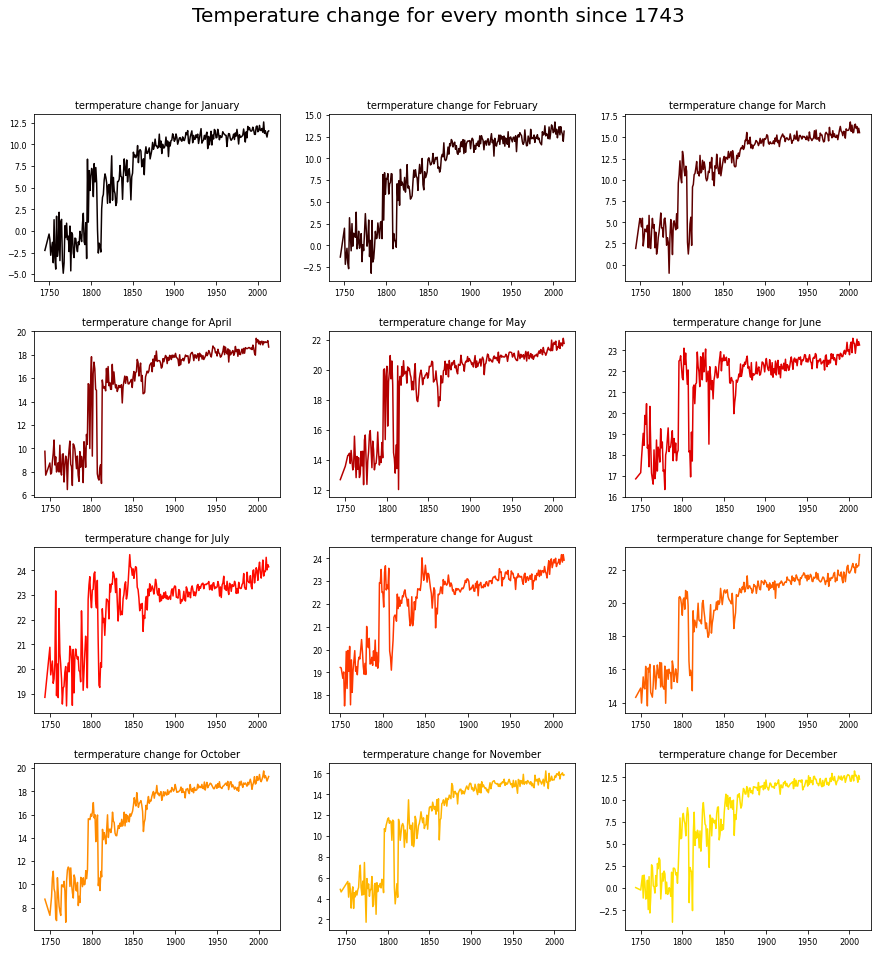

In [10]:
grouped=df.groupby(["year","month_num","month"])["AverageTemperature"].mean().reset_index().sort_values(["year","month_num"])

fig,axes=plt.subplots(4,3,figsize=(15,15))
months=["January","February","March","April","May","June","July","August","September","October","November","December"]
#months=grouped.month.unique()
colors=list(plt.get_cmap("hot")(np.linspace(0,0.7,12)))

for ax,m,c in zip(axes.ravel(),months,colors):
    grouped[grouped.month==m].plot(kind="line",ax=ax,legend=False,xlabel="",x="year",y="AverageTemperature",fontsize=8,color=c)
    ax.set_title("termperature change for "+m,size=10)
    plt.subplots_adjust(hspace=0.3)
    plt.suptitle("Temperature change for every month since 1743",size=20)
plt.show()

### Top 10 hottest countries by year

In [11]:
grouped=df.groupby(["year","Country"])["AverageTemperature"].mean().reset_index().sort_values(["year","AverageTemperature"],ascending=(True,False))
top=grouped.groupby("year").head(1)
countries=top["Country"].value_counts().reset_index()

In [12]:
fig=px.bar(countries, x="index",y="Country",
          color_discrete_sequence=["red"])
fig.update_layout(title_text="How many times countries have been the hottest in the world for the entire year")
fig.update_xaxes(title_text=None)
fig.update_yaxes(title_text="Times being the hottest country")

fig2=px.pie(countries,names="index",values="Country")

fig.show()
fig2.show()


In [13]:
grouped=df.groupby(["year","City","Country","Latitude","Longitude"],as_index=False)["AverageTemperature"].mean().reset_index().sort_values(["year","City"])

In [14]:
fig=px.scatter(grouped[grouped.year>2000],y="Latitude",x="Longitude",
          animation_frame="year",
          hover_name="Country",
               color="AverageTemperature")

fig.update_layout(title_text="Average temperature change in the world",title_font=dict(size=15),font=dict(size=8))

fig.show()

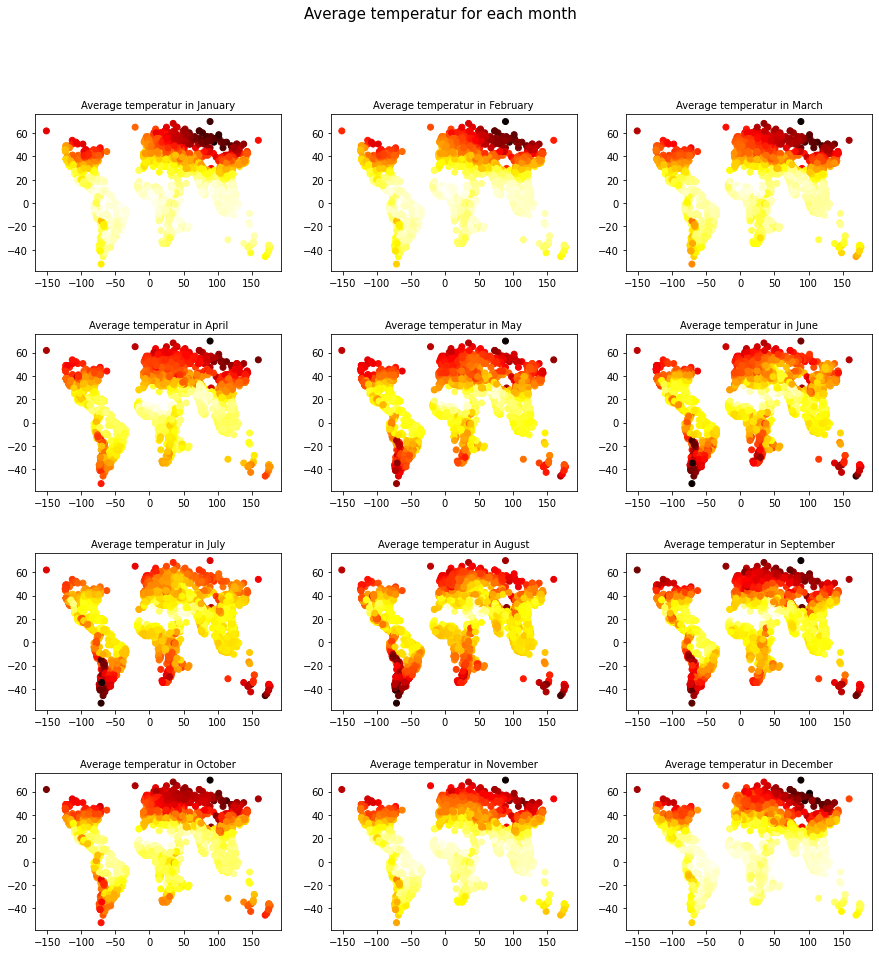

In [23]:
grouped=df[df.year==2010].groupby(["month","month_num","City","Country","Latitude","Longitude"],as_index=False)["AverageTemperature"].mean().reset_index().sort_values("month_num")

months=["January","February","March","April","May","June","July","August","September","October","November","December"]
fig,axes=plt.subplots(4,3,figsize=(15,15))
for ax,m in zip(axes.ravel(),months):
    filtered=grouped[grouped.month==m]
    ax.scatter(filtered.Longitude,filtered.Latitude,c=filtered.AverageTemperature,cmap="hot")
    ax.set_title("Average temperatur in "+m,size=10)
    plt.subplots_adjust(hspace=0.4)

    plt.suptitle("Average temperatur for each month",size=15)
plt.show()
    

In [16]:
#south semisphere becomes hotter in winter

In [26]:
fig=px.scatter(grouped,x="Longitude",y="Latitude",
          animation_frame="month",
          color="AverageTemperature",hover_name="Country")
fig.update_layout(title_text="Average temperature for each month",title_font=dict(size=20),font=dict(size=8),
                 plot_bgcolor="white")
fig.show()

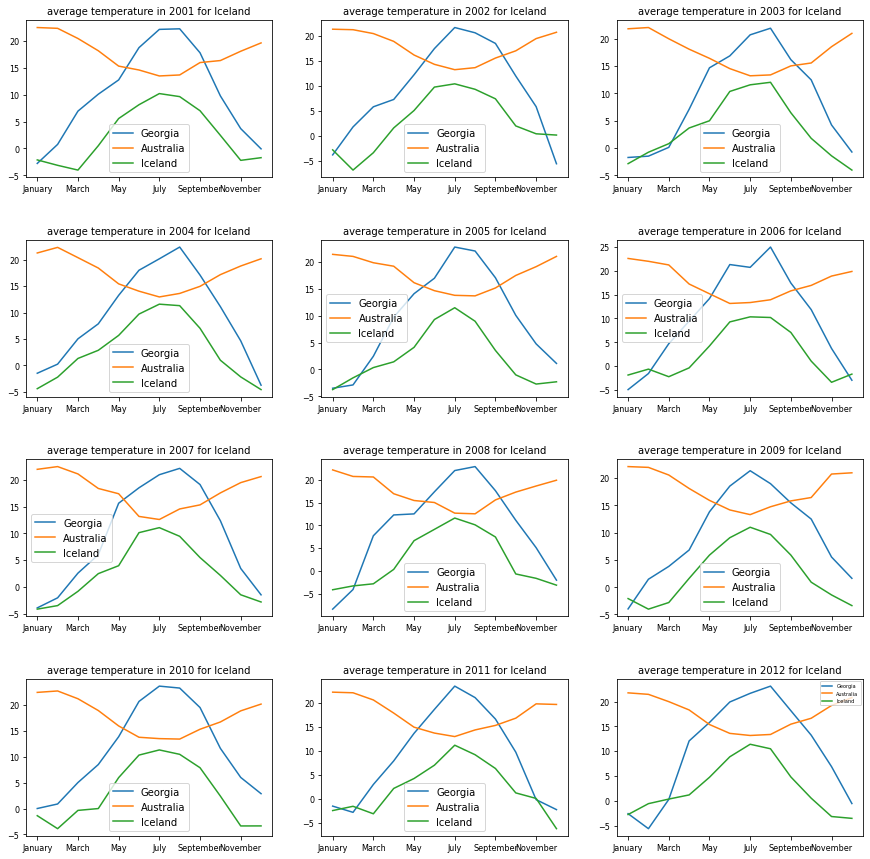

In [19]:
ndf=df[df.year>2000]

years=ndf.year.unique()
fig,axes=plt.subplots(4,3,figsize=(15,15))
countries=["Georgia","Australia","Iceland"]

for ax,year in zip(axes.ravel(),years):
    for country in countries:
        grouped=ndf[(ndf.year==year)&(ndf.Country==country)].groupby(["month_num","month"])["AverageTemperature"].mean().reset_index().sort_values("month_num")
        grouped.plot(ax=ax,kind="line",x="month",y="AverageTemperature",legend=True,xlabel="",label=country,fontsize=8)
        ax.set_title(f"average temperature in {year} for {country}",size=10)
plt.legend(loc='upper right',fontsize=5)
plt.subplots_adjust(hspace=0.4)
        
plt.show()

In [20]:
grouped=df.groupby("year")["AverageTemperature"].mean().reset_index()
grouped=grouped[grouped.year>=1800]
grouped["previous_year_temperature"]=grouped.AverageTemperature.shift(1)
grouped["change_in_percent"]=((grouped.AverageTemperature-grouped.previous_year_temperature)/grouped.previous_year_temperature*100).round(2)

In [21]:
fig=px.bar(grouped,x="year",y="change_in_percent",
          color_discrete_sequence=["red"],text="change_in_percent")
fig.update_layout(title_text="how avg yearly temperature has been changing compared to previous year",
                 yaxis_tickformat="%")